In [1]:
%matplotlib inline
import tensorflow
from densenet_old_gl import densenet121_attn_gl
import torch
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
from keras.preprocessing.image import load_img, img_to_array
from scipy.misc import imresize
import glob
from visualize import make_dot

import os
os.environ["CUDA_VISIBLE_DEVICES"]="0"

Using TensorFlow backend.


In [2]:
def plot_data_img(img):
    # Create figure and axes
    fig,ax = plt.subplots(1)

    # Display the image
    ax.imshow(img)
    
    plt.show()
    
def plot_mask(img, m1, m2, m3, title=None, filename=None):
    """
    Plots the given torch tensor as grayscale mask
    """
    _ = plt.figure(figsize = (10,10))
    _ = plt.subplot(2,2,1)
    _ = plt.axis('off')
    if title is not None:
        _ = plt.suptitle(title, verticalalignment='bottom', y=0.9)
    _ = plt.imshow(img)
    _ = plt.subplot(2,2,2)
    _ = plt.axis('off')
    _ = plt.imshow(img)
    m = imresize(m1.data.numpy()[0], (299,299))
    _ = plt.imshow(m, 'jet', interpolation='none', alpha=0.5)
    _ = plt.subplot(2,2,3)
    _ = plt.axis('off')
    _ = plt.imshow(img)
    m = imresize(m2.data.numpy()[0], (299,299))
    _ = plt.imshow(m, 'jet', interpolation='none', alpha=0.5)
    _ = plt.subplot(2,2,4)
    _ = plt.axis('off')
    _ = plt.imshow(img)
    m = imresize(m3.data.numpy()[0], (299,299))
    _ = plt.imshow(m, 'jet', interpolation='none', alpha=0.5)
    _ = plt.show()
    if filename is not None:
        _ = plt.savefig(filename+'_mask.png')
    
def get_img_array(path, target_dim=(299,299)):
    """
    Given path of image, returns it's numpy array
    """
    return img_to_array(load_img(path, target_size=target_dim))/255.0

In [3]:
# one image
img_path = '/home/birdsnap/CUB_200_2011/cropped_test/validation/200.Common_Yellowthroat/Common_Yellowthroat_0004_190606.jpg'
img = get_img_array(img_path)
img_v = torch.autograd.Variable(torch.Tensor(img).view(1,3,299,299))

In [3]:
import sys
sys.path.append('densenet_model/')
from densenet_old_gl_wo_gap import densenet121_old_gl_wo_gap
weights = '../models/den_121_attn_gl_wo_gap_49_0.733125.pth'
d = densenet121_old_gl_wo_gap(weights=weights, mask_only=True)

Setting drop_rate = 0
[ConvOnly] Using DenseNet as feature extractor


/home/birdsnap/venv2/lib/python2.7/site-packages/ipykernel_launcher.py:23: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/home/birdsnap/venv2/lib/python2.7/site-packages/ipykernel_launcher.py:28: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/home/birdsnap/venv2/lib/python2.7/site-packages/ipykernel_launcher.py:33: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.


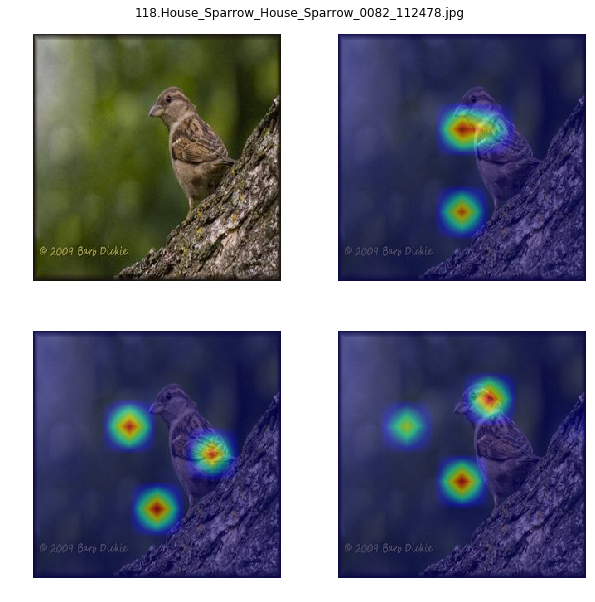

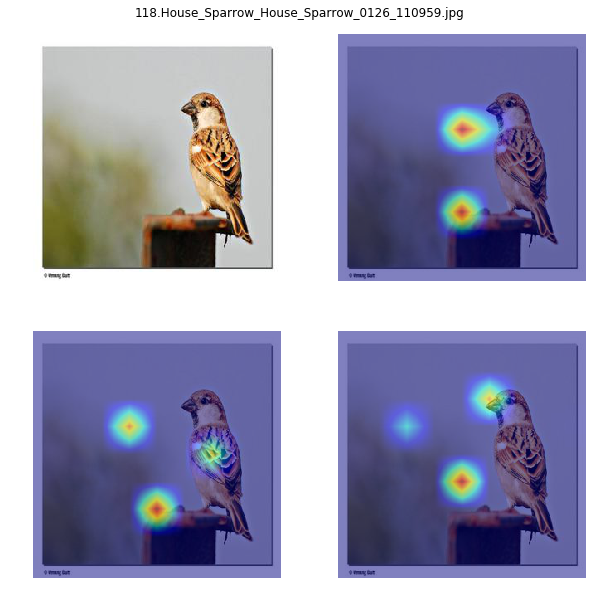

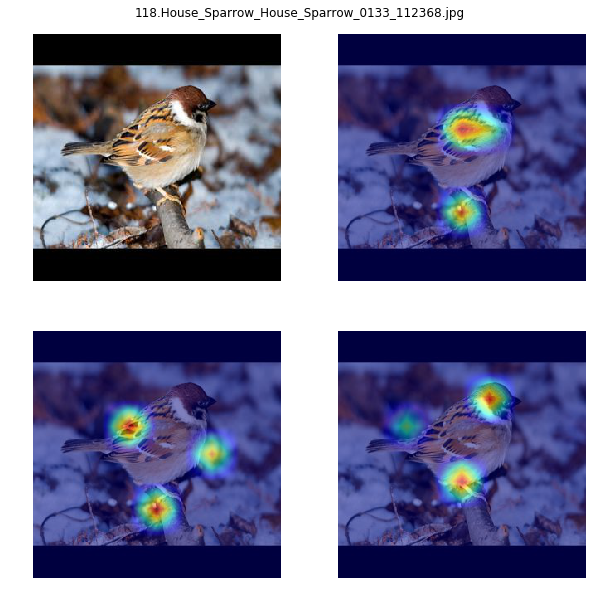

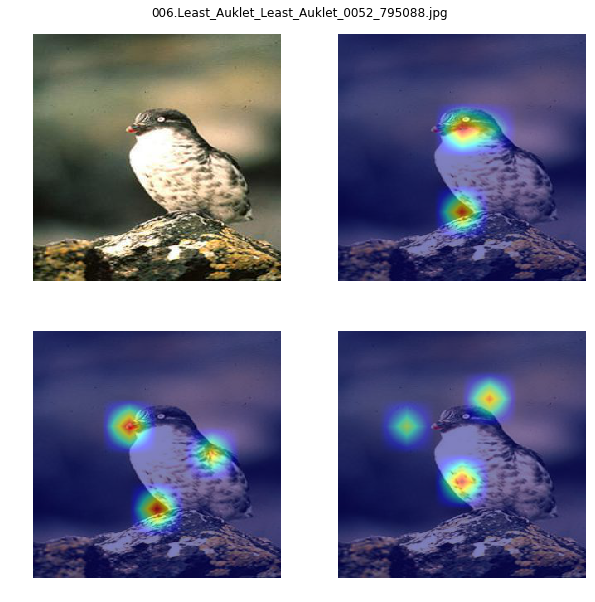

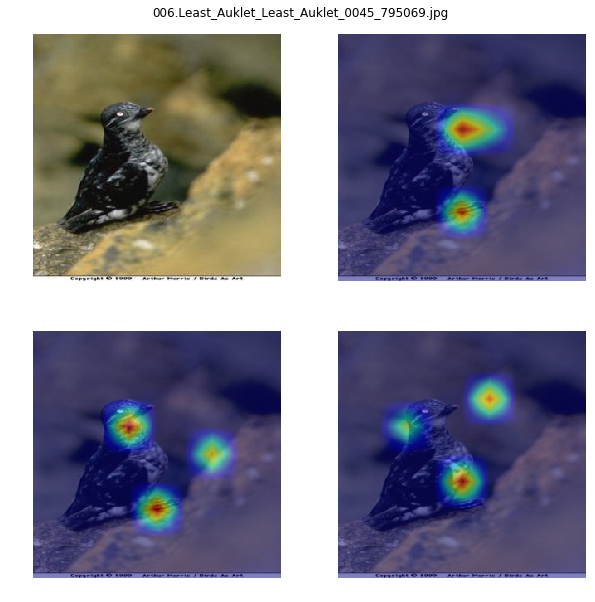

...

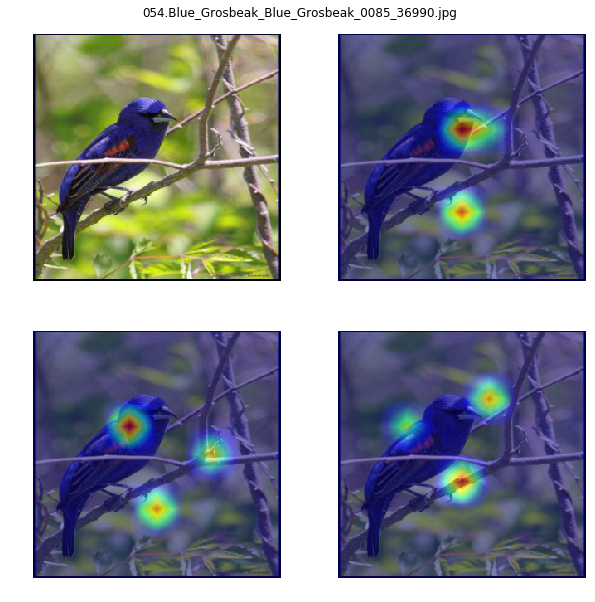

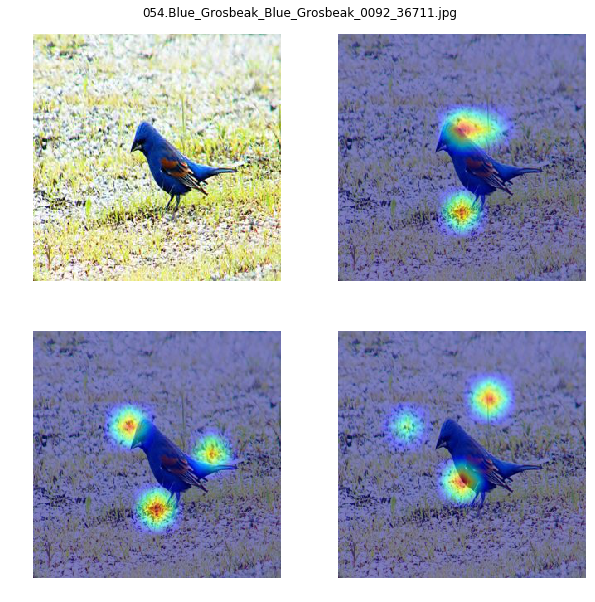

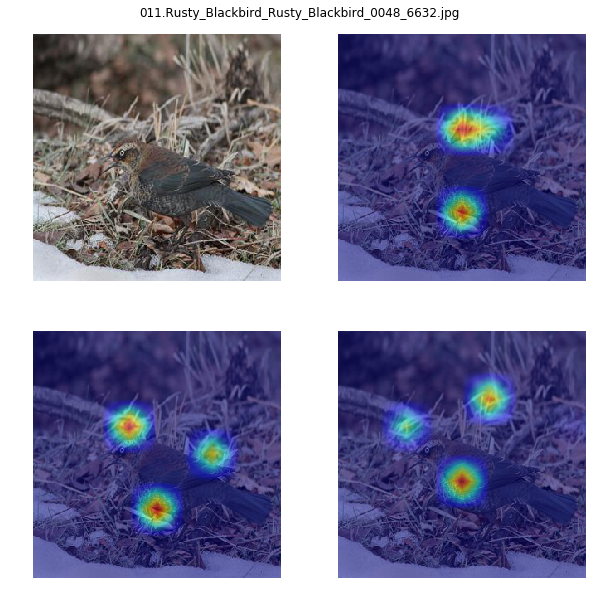

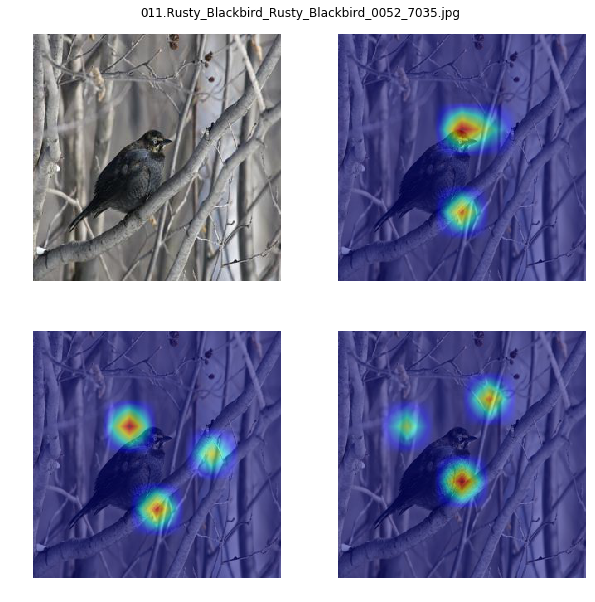

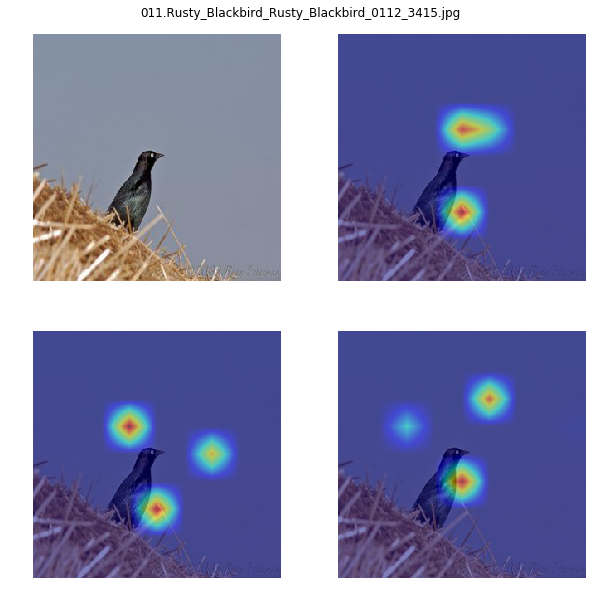

In [4]:
# multiple images
data_dir = '/home/birdsnap/CUB_200_2011/cub_299_299/validation'
base_save_path = '../vis/1_simpleFCmaskPred/'
folders = [file for file in glob.glob(data_dir+'*/*')]
for folder in folders[:10]:
    files = [file for file in glob.glob(folder + '/*')]
    file_sample = np.random.choice(files, 3, replace=False)
    sample = [get_img_array(i) for i in file_sample]
    img_v = [torch.autograd.Variable(torch.Tensor(i).view(1,3,299,299)) for i in sample]
    img_v = torch.cat(img_v, 0)
    m1, m2, m3 = d(img_v)
    for i in range(3):
        filename = folder.split('/')[-1] + '_' + file_sample[i].split('/')[-1]
        full_path = base_save_path + filename
        plot_mask(sample[i], m1[i], m2[i], m3[i], title=filename, filename=full_path)

In [5]:
torch.__version__

'0.2.0_3'